In [1]:
import TopicModelingModule as tmm
import pandas as pd
import os

[nltk_data] Downloading package omw-1.4 to /home/vincent/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


---

### Selection of the corpus

    3. First, we import the whole corpus that has been preprocessed previously.

In [2]:
data = pd.read_csv("CleanDataset.csv")
data

,Toxicity,tweet,tweet_clean,tweet_tokenized,tweet_tok=2,tweet_lemmatized,preprocessed_text
0,0,@user when a father is dysfunctional and is so...,father dysfunctional selfish drags kids dysfun...,"['father', 'dysfunctional', 'selfish', 'drags'...","[('father', 'dysfunctional'), ('dysfunctional'...","['father', 'dysfunctional', 'selfish', 'drag',...",father dysfunctional selfish drag kid dysfunct...
1,0,@user @user thanks for #lyft credit i can't us...,thanks lyft credit can not use cause do not ...,"['thanks', 'lyft', 'credit', 'can', 'not', 'us...","[('thanks', 'lyft'), ('lyft', 'credit'), ('cre...","['thank', 'lyft', 'credit', 'can', 'not', 'use...",thank lyft credit can not use cause do not off...
2,0,bihday your majesty,bihday majesty,"['bihday', 'majesty']","[('bihday', 'majesty')]","['bihday', 'majesty']",bihday majesty
3,0,factsguide: society now #motivation,factsguide society motivation,"['factsguide', 'society', 'motivation']","[('factsguide', 'society'), ('society', 'motiv...","['factsguide', 'society', 'motivation']",factsguide society motivation
4,0,[2/2] huge fan fare and big talking before the...,huge fan fare big talking leave chaos pay disp...,"['huge', 'fan', 'fare', 'big', 'talking', 'lea...","[('huge', 'fan'), ('fan', 'fare'), ('fare', 'b...","['huge', 'fan', 'fare', 'big', 'talk', 'leave'...",huge fan fare big talk leave chaos pay dispute...
...,...,...,...,...,...,...,...
52171,1,you's a muthaf***in lie &#8220;@LifeAsKing: @2...,yous muthafin lie right tl trash mine bible sc...,"['yous', 'muthafin', 'lie', 'right', 'tl', 'tr...","[('yous', 'muthafin'), ('muthafin', 'lie'), ('...","['yous', 'muthafin', 'lie', 'right', 'tl', 'tr...",yous muthafin lie right tl trash mine bible sc...
52172,1,"you've gone and broke the wrong heart baby, an...",you have gone broke wrong heart baby drove re...,"['', 'you', 'have', 'gone', 'broke', 'wrong', ...","[('', 'you'), ('you', 'have'), ('have', 'gone'...","['', 'you', 'have', 'go', 'break', 'wrong', 'h...",you have go break wrong heart baby drive redn...
52173,1,young buck wanna eat!!.. dat nigguh like I ain...,young buck wanna eat dat nigguh like am not f...,"['young', 'buck', 'wanna', 'eat', 'dat', 'nigg...","[('young', 'buck'), ('buck', 'wanna'), ('wanna...","['young', 'buck', 'wanna', 'eat', 'dat', 'nigg...",young buck wanna eat dat nigguh like be not fu...
52174,1,youu got wild bitches tellin you lies,youu got wild bitches tellin lies,"['youu', 'got', 'wild', 'bitches', 'tellin', '...","[('youu', 'got'), ('got', 'wild'), ('wild', 'b...","['youu', 'get', 'wild', 'bitch', 'tellin', 'lie']",youu get wild bitch tellin lie


    2. Then, we have to create subsets of this dataframe between lemmatized tweets or cleaned tweets.

In [3]:
lemm_full = data[["Toxicity", "preprocessed_text"]]
clean_full = data[["Toxicity", "tweet_clean"]]

    3. Finaly, we separate our tweets according to their toxicity classification.

In [4]:
lemm_0 = lemm_full[lemm_full["Toxicity"] == 0]
lemm_1 = lemm_full[lemm_full["Toxicity"] == 1]

clean_0 = clean_full[clean_full["Toxicity"] == 0]
clean_1 = clean_full[clean_full["Toxicity"] == 1]

---

### Define a function to apply TM to the different corpus

In [5]:
def topicmod(corpus, n, mini, num_topics, y, x):
    tm_lf = tmm.GensimTopicModeling(corpus=corpus)
    
    tm_lf.compute_bigrams(n=n, mini=mini)
    tm_lf.vocabulary_from_corpus()
    
    tm_lf.model_training(num_topics=num_topics)
    
    df = tm_lf.top_topics_and_coherence()
    
    img = tm_lf.draw_word_clouds(y=y, x=x)
        
    pylda = tm_lf.visualisation_pyldavis()
    
    return df, img, pylda

----

### Topic modeling with the *lemmatized* corpus

    1. Full lemmatized corpus

In [6]:
lf_corpus = lemm_full["preprocessed_text"].to_list()
tok = tmm.PreprocessingCorpus(corpus=lf_corpus)
tok.tokenization()
lf_corpus = tok.corpus

Tokenization done.


The generated dictionary contains 6692 unique tokens.
Number of unique tokens: 6692
Number of documents: 52176
The model has been trained successfully.
Average topic coherence: -6.7285.

-3.629054684008648 ['not', 'be', 'do', 'go', 'trash', 'say', 'amp', 'make', 'know', 'one', 'want', 'think', 'can', 'see', 'call', 'bird', 'talk', 'thats', 'youre', 'take']

-3.8942836471185216 ['bitch', 'rt', 'get', 'like', 'fuck', 'nigga', 'as', 'lol', 'look', 'yall', 'man', 'ya', 'give', 'life', 'would', 'dick', 'little', 'lmao', 'gotta', 'damn']

-4.922789554973594 ['girl', 'ame', 'new', 'today', 'work', 'friend', 'need', 'yankee', 'yellow', 'year', 'night', 'turn', 'first', 'best', 'wait', 'next', 'two', 'tonight', 'walk', 'home']

-6.592601742947887 ['yo', 'retard', 'play', 'bout', 'put', 'ill', 'cunt', 'charlie', 'big', 'face', 'fat', 'show', 'niggah', 'name', 'leave', 'cuz', 'school', 'could', 'another', 'thank']

-6.731037542058957 ['hoe', 'pussy', 'shit', 'love', 'day', 'good', 'eat', 'wit', '

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transp

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transp

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/vincent/min

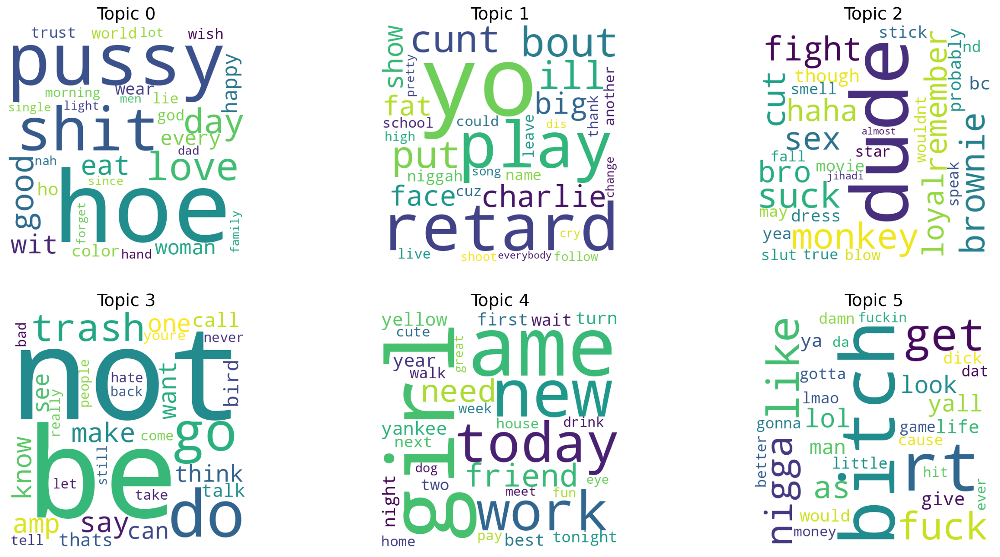

In [7]:
df1, img1, pylda1, = topicmod(corpus=lf_corpus, n=2, mini=20, num_topics=6, y=2, x=3)

In [8]:
df1

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
Topic coherence,-3.629055,-3.894284,-4.92279,-6.592602,-6.731038,-14.601081
Word 1,not,bitch,girl,yo,hoe,dude
Word 2,be,rt,ame,retard,pussy,monkey
Word 3,do,get,new,play,shit,suck
Word 4,go,like,today,bout,love,brownie
Word 5,trash,fuck,work,put,day,fight
Word 6,say,nigga,friend,ill,good,cut
Word 7,amp,as,need,cunt,eat,sex
Word 8,make,lol,yankee,charlie,wit,remember
Word 9,know,look,yellow,big,every,haha


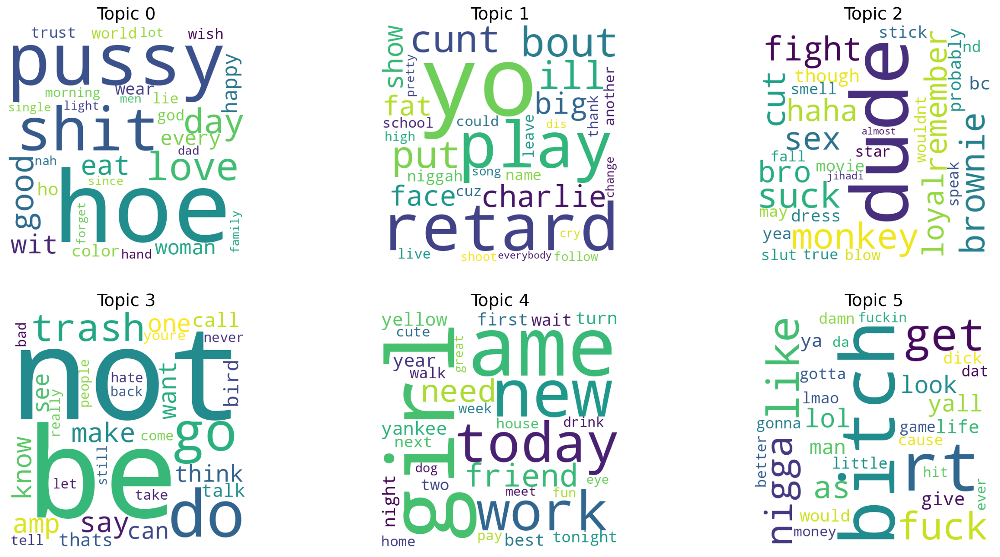

In [9]:
img1

In [10]:
pylda1

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.235936  0.347469       1        1  30.835631
5     -0.407869  0.160076       2        1  25.423531
0      0.023681 -0.204073       3        1  13.549994
4      0.082034 -0.036726       4        1  12.716973
1      0.033297 -0.168809       5        1  11.248478
2      0.032921 -0.097937       6        1   6.225394, topic_info=        Term          Freq         Total Category  logprob  loglift
836    bitch  17037.000000  17037.000000  Default  30.0000  30.0000
6282      rt  13564.000000  13564.000000  Default  29.0000  29.0000
2064     hoe   8683.000000   8683.000000  Default  28.0000  28.0000
830    pussy   4162.000000   4162.000000  Default  27.0000  27.0000
10       not   6600.000000   6600.000000  Default  26.0000  26.0000
...      ...           ...           ...      ...      ...      ...
823     true    141.615969    142.436181   Topic6  -5.0846   2.7708
1310    fall    139.018623    139.840636   Topic6  -5.1031   2.7706
3391    blow    138.470987    139.294555   Topic6  -5.1070   2.7706
6325  jihadi    137.990440    138.815355   Topic6  -5.1105   2.7706
2776  almost    120.032010    120.853789   Topic6  -5.2499   2.7697

[212 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
2776      6  0.992935   almost
114       4  0.999195      ame
115       1  0.999277      amp
618       5  0.997629  another
976       2  0.999755       as
...     ...       ...      ...
3748      6  0.996291      yea
40        4  0.998942     year
1629      4  0.998149   yellow
3363      5  0.999664       yo
814       1  0.999625    youre

[184 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 6, 1, 5, 2, 3])

    2. Toxic lemmatized tweets

In [11]:
l1_corpus = lemm_1["preprocessed_text"].to_list()
tok = tmm.PreprocessingCorpus(corpus=l1_corpus)
tok.tokenization()
l1_corpus = tok.corpus

Tokenization done.


The generated dictionary contains 3373 unique tokens.
Number of unique tokens: 3373
Number of documents: 23063
The model has been trained successfully.
Average topic coherence: -9.4187.

-3.1202009701216586 ['bitch', 'not', 'be', 'get', 'like', 'fuck', 'do', 'as', 'shit', 'go', 'say', 'know', 'lol', 'make', 'look', 'want', 'one', 'can', 'love', 'call']

-4.972534974141644 ['rt', 'hoe', 'nigga', 'amp', 'girl', 'yall', 'think', 'never', 'take', 'still', 'right', 'stop', 'would', 'little', 'woman', 'tweet', 'ugly', 'ur', 'work', 'big']

-10.772315296639597 ['trash', 'white', 'lmao', 'gotta', 'damn', 'ghetto', 'black', 'fag', 'ho', 'car', 'dyke', 'pretty', 'sorry', 'ames', 'color', 'haha', 'loyal', 'thank', 'wow', 'drive']

-11.19607576871273 ['pussy', 'yo', 'eat', 'cunt', 'fat', 'shes', 'around', 'yeah', 'wear', 'trust', 'care', 'kid', 'shut', 'shoot', 'sex', 'young', 'song', 'basic', 'hot', 'home']

-13.122129191280658 ['bout', 'nigger', 'ill', 'twitter', 'head', 'night', 'first', 'femal

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:520: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  Image.ROTATE_90)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.


/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transp

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


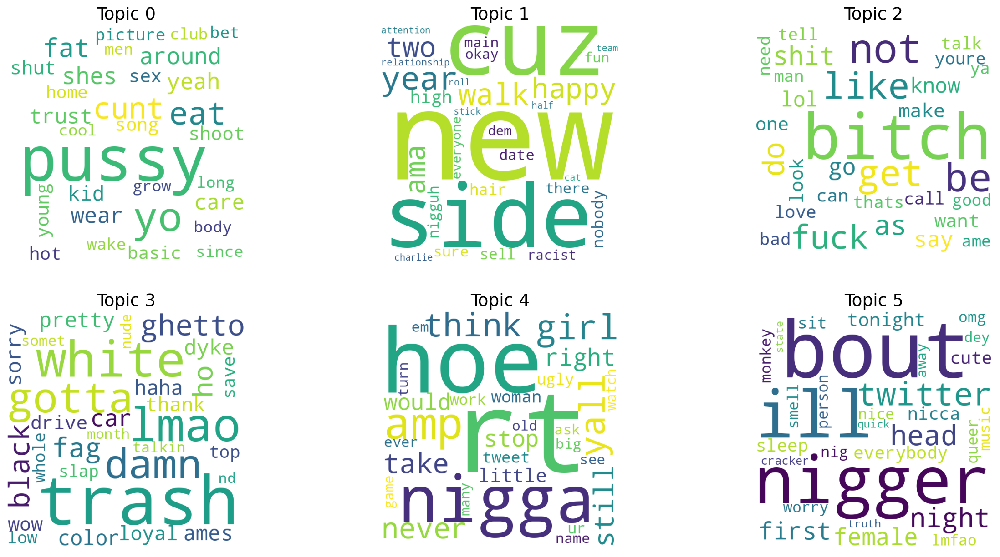

In [12]:
df2, img2, pylda2, = topicmod(corpus=l1_corpus, n=2, mini=20, num_topics=6, y=2, x=3)

In [13]:
df2

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
Topic coherence,-3.120201,-4.972535,-10.772315,-11.196076,-13.122129,-13.328698
Word 1,bitch,rt,trash,pussy,bout,new
Word 2,not,hoe,white,yo,nigger,cuz
Word 3,be,nigga,lmao,eat,ill,side
Word 4,get,amp,gotta,cunt,twitter,year
Word 5,like,girl,damn,fat,head,walk
Word 6,fuck,yall,ghetto,shes,night,happy
Word 7,do,think,black,around,first,two
Word 8,as,never,fag,yeah,female,ama
Word 9,shit,take,ho,wear,tonight,high


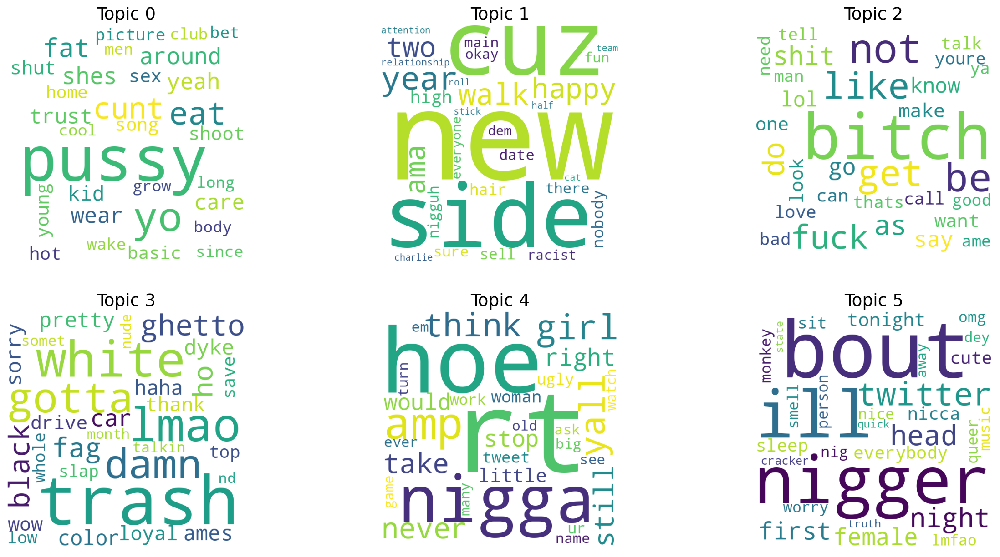

In [14]:
img2

In [15]:
pylda2

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.384709  0.200226       1        1  50.058311
4     -0.119949 -0.409660       2        1  24.120481
0      0.165068  0.079352       3        1   8.527557
3      0.120238  0.048905       4        1   6.363535
1      0.112998  0.041886       5        1   5.604073
5      0.106354  0.039292       6        1   5.326043, topic_info=         Term          Freq         Total Category  logprob  loglift
1925       rt   7541.000000   7541.000000  Default  30.0000  30.0000
1268    bitch  11710.000000  11710.000000  Default  29.0000  29.0000
298       hoe   4374.000000   4374.000000  Default  28.0000  28.0000
387     pussy   2102.000000   2102.000000  Default  27.0000  27.0000
987     nigga   2172.000000   2172.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
2844      dey     69.596045     70.410803   Topic6  -4.8462   2.9209
1687  cracker     64.604309     65.415468   Topic6  -4.9207   2.9201
579     truth     60.413114     61.225644   Topic6  -4.9878   2.9192
92      state     56.558172     57.369202   Topic6  -5.0537   2.9183
1383    quick     56.217473     57.028814   Topic6  -5.0597   2.9182

[215 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
1734      5  0.997718     ama
142       1  0.997723     ame
99        4  0.994847    ames
39        2  0.998637     amp
27        3  0.994409  around
...     ...       ...     ...
1460      3  0.995103    yeah
281       5  0.997789    year
1521      3  0.999473      yo
126       3  0.995064   young
132       1  0.999249   youre

[193 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 5, 1, 4, 2, 6])

    3. Non toxic lemmatized tweets

In [16]:
l0_corpus = lemm_0["preprocessed_text"].to_list()
tok = tmm.PreprocessingCorpus(corpus=l0_corpus)
tok.tokenization()
l0_corpus = tok.corpus

Tokenization done.


The generated dictionary contains 4831 unique tokens.
Number of unique tokens: 4831
Number of documents: 29113
The model has been trained successfully.
Average topic coherence: -6.5464.

-4.011478993862305 ['not', 'like', 'make', 'do', 'one', 'yankee', 'see', 'can', 'want', 'people', 'know', 'feel', 'bihday', 'wait', 'lol', 'watch', 'game', 'even', 'play', 'thing']

-4.993051852040526 ['rt', 'be', 'get', 'go', 'amp', 'ame', 'charlie', 'come', 'yellow', 'take', 'thank', 'work', 'back', 'year', 'week', 'night', 'never', 'brownie', 'last', 'give']

-5.604015935043308 ['love', 'smile', 'friend', 'girl', 'fun', 'weekend', 'family', 'summer', 'friday', 'home', 'beautiful', 'cute', 'sunday', 'monkey', 'follow', 'eat', 'dog', 'baby', 'enjoy', 'selfie']

-6.03861369478247 ['day', 'bird', 'happy', 'today', 'new', 'look', 'father', 'great', 'first', 'tonight', 'via', 'tomorrow', 'dad', 'fathersday', 'wish', 'amaze', 'ready', 'season', 'free', 'ames']

-6.555409155001002 ['trash', 'life', 'good', 

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Tr

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.


/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


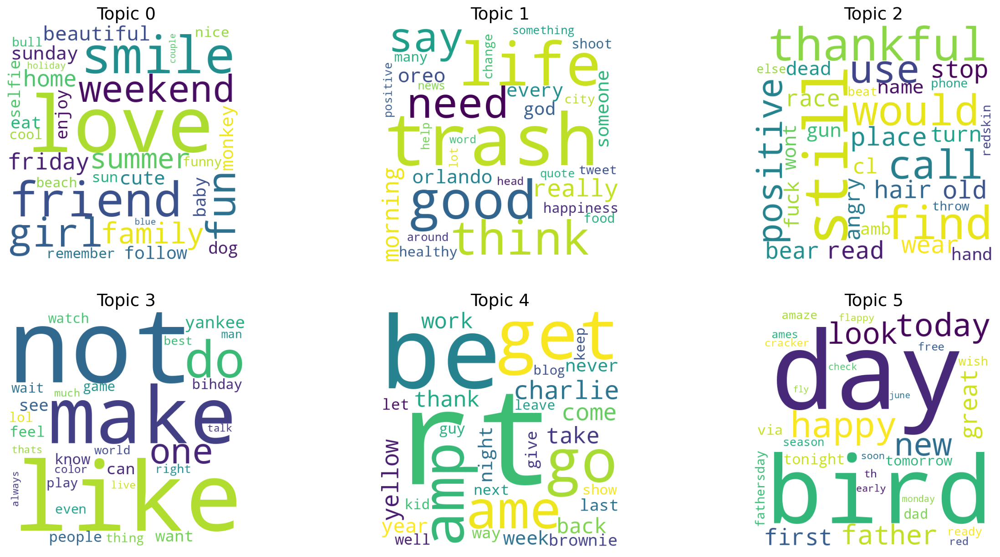

In [17]:
df3, img3, pylda3, = topicmod(corpus=l0_corpus, n=2, mini=20, num_topics=6, y=2, x=3)

In [18]:
df3

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
Topic coherence,-4.011479,-4.993052,-5.604016,-6.038614,-6.555409,-12.075823
Word 1,not,rt,love,day,trash,still
Word 2,like,be,smile,bird,life,thankful
Word 3,make,get,friend,happy,good,find
Word 4,do,go,girl,today,think,would
Word 5,one,amp,fun,new,need,call
Word 6,yankee,ame,weekend,look,say,use
Word 7,see,charlie,family,father,really,positive
Word 8,can,come,summer,great,morning,place
Word 9,want,yellow,friday,first,oreo,old


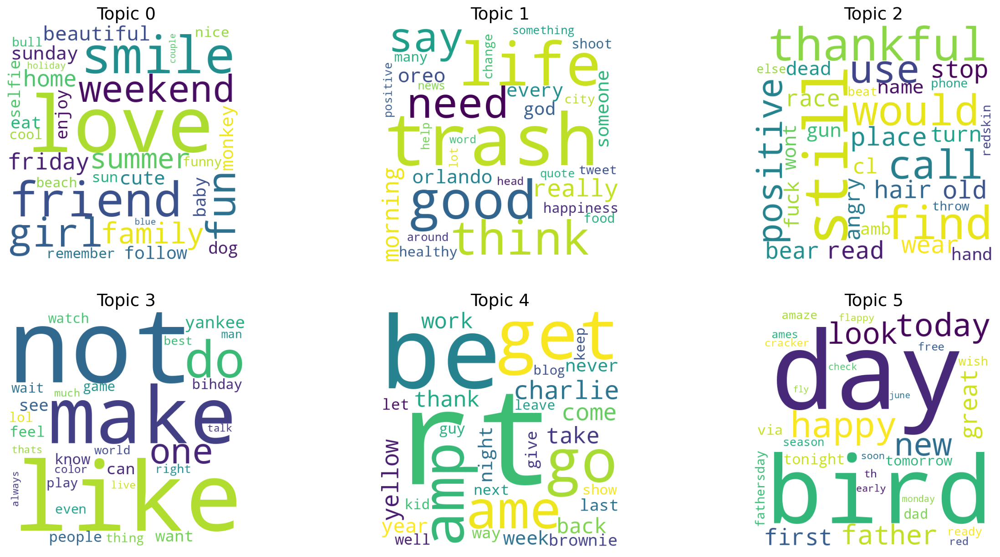

In [19]:
img3

In [20]:
pylda3

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.407461  0.135851       1        1  25.152943
3     -0.213976  0.335284       2        1  23.827752
5     -0.017188 -0.271488       3        1  14.106090
0     -0.057624 -0.087598       4        1  14.055277
1     -0.060700 -0.065493       5        1  13.391684
2     -0.057973 -0.046555       6        1   9.466254, topic_info=          Term         Freq        Total Category  logprob  loglift
4760        rt  3133.000000  3133.000000  Default  30.0000  30.0000
44        love  2000.000000  2000.000000  Default  29.0000  29.0000
65         day  1996.000000  1996.000000  Default  28.0000  28.0000
420       bird  1469.000000  1469.000000  Default  27.0000  27.0000
2773     trash  1352.000000  1352.000000  Default  26.0000  26.0000
...        ...          ...          ...      ...      ...      ...
683       else   104.539396   105.347343   Topic6  -5.1516   2.3497
4814   redskin   102.086973   102.913086   Topic6  -5.1753   2.3494
588       beat    99.094071    99.902005   Topic6  -5.2051   2.3493
633      polar    96.345123    97.145344   Topic6  -5.2332   2.3492
195   positive   203.598484   385.904184   Topic6  -4.4850   1.7180

[220 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
343       2  0.995911  always
194       3  0.997211   amaze
629       6  0.992932     amb
100       1  0.999655     ame
223       3  0.994012    ames
...     ...       ...     ...
222       2  0.998478   world
718       6  0.997041   would
4763      2  0.998813  yankee
39        1  0.997385    year
1461      1  0.999255  yellow

[201 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 6, 1, 2, 3])

----

### Topic modeling with the *cleaned* corpus

    1. Full cleaned corpus

In [21]:
cf_corpus = clean_full["tweet_clean"].to_list()
tok = tmm.PreprocessingCorpus(corpus=cf_corpus)
tok.tokenization()
cf_corpus = tok.corpus

Tokenization done.


The generated dictionary contains 8064 unique tokens.
Number of unique tokens: 8064
Number of documents: 52176
The model has been trained successfully.
Average topic coherence: -6.6208.

-3.4523127434195677 ['not', 'am', 'like', 'do', 'get', 'ass', 'fuck', 'got', 'shit', 'nigga', 'know', 'one', 'can', 'thats', 'make', 'never', 'see', 'people', 'think', 'really']

-4.412863027571185 ['rt', 'bitch', 'hoe', 'trash', 'lol', 'niggas', 'yo', 'want', 'go', 'ame', 'youre', 'bad', 'man', 'back', 'wit', 'wanna', 'tell', 'little', 'girls', 'dat']

-5.733582633405968 ['amp', 'love', 'yall', 'ya', 'girl', 'life', 'let', 'always', 'every', 'better', 'stupid', 'charlie', 'much', 'eat', 'tho', 'keep', 'many', 'us', 'could', 'another']

-7.864078602538522 ['bitches', 'good', 'need', 'gonna', 'happy', 'da', 'niggah', 'ho', 'face', 'friends', 'stay', 'ama', 'hot', 'makes', 'hard', 'morning', 'yes', 'young', 'everyone', 'dis']

-7.914363862491666 ['hoes', 'day', 'bird', 'dick', 'today', 'big', 'birds', 'f

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.


/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transp

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


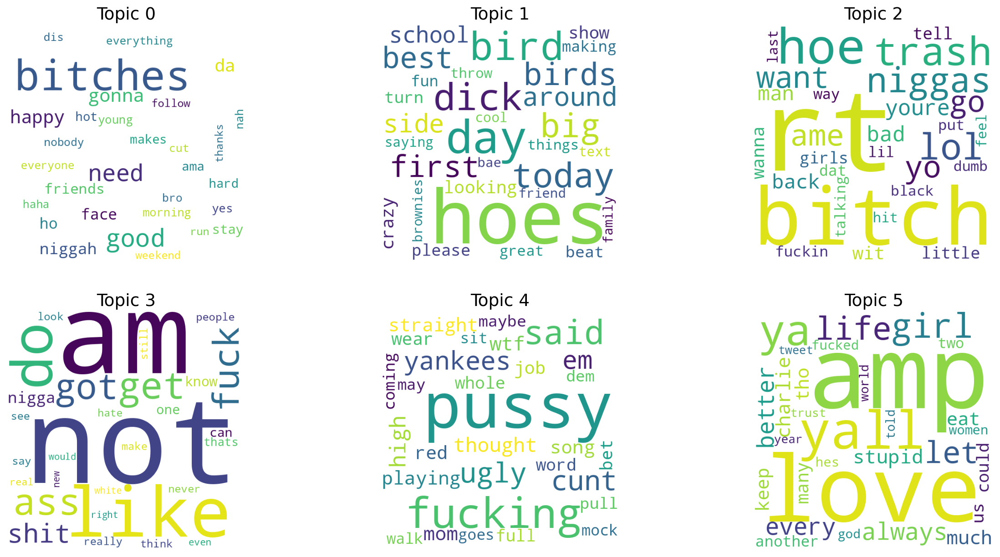

In [22]:
df4, img4, pylda4 = topicmod(corpus=cf_corpus, n=2, mini=20, num_topics=6, y=2, x=3)

In [23]:
df4

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
Topic coherence,-3.452313,-4.412863,-5.733583,-7.864079,-7.914364,-10.347466
Word 1,not,rt,amp,bitches,hoes,pussy
Word 2,am,bitch,love,good,day,fucking
Word 3,like,hoe,yall,need,bird,said
Word 4,do,trash,ya,gonna,dick,ugly
Word 5,get,lol,girl,happy,today,cunt
Word 6,ass,niggas,life,da,big,yankees
Word 7,fuck,yo,let,niggah,birds,em
Word 8,got,want,always,ho,first,high
Word 9,shit,go,every,face,best,thought


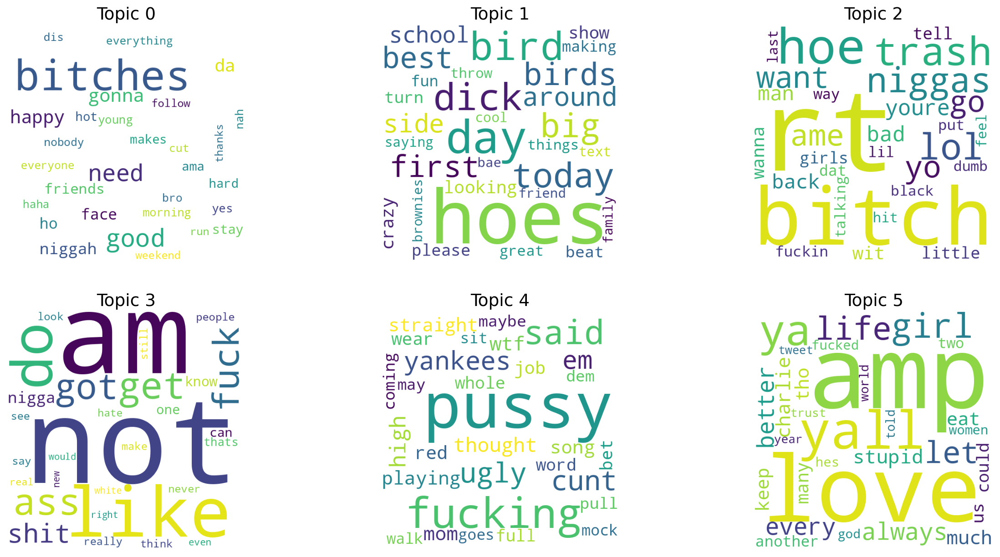

In [24]:
img4

In [26]:
pylda4

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.383293  0.204368       1        1  28.930121
2      0.280649  0.330093       2        1  23.757152
5      0.033104 -0.181585       3        1  15.453088
0      0.028655 -0.131737       4        1  12.862960
1      0.020526 -0.114314       5        1  10.611932
4      0.020360 -0.106825       6        1   8.384749, topic_info=         Term          Freq         Total Category  logprob  loglift
7569       rt  14544.000000  14544.000000  Default  30.0000  30.0000
2284    bitch  12930.000000  12930.000000  Default  29.0000  29.0000
926   bitches   7056.000000   7056.000000  Default  28.0000  28.0000
3183     hoes   5091.000000   5091.000000  Default  27.0000  27.0000
918     pussy   3616.000000   3616.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
54        may    146.216366    147.026152   Topic6  -5.3313   2.4732
1570     walk    142.274294    143.086892   Topic6  -5.3586   2.4731
7166     mock    140.090958    140.905685   Topic6  -5.3741   2.4730
222      goes    136.703315    137.514232   Topic6  -5.3985   2.4728
2931      sit    133.479251    134.293222   Topic6  -5.4224   2.4727

[211 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
405       3  0.998077  always
44        1  0.999887      am
1786      4  0.998634     ama
111       2  0.998930     ame
112       3  0.999395     amp
...     ...       ...     ...
38        3  0.996829    year
390       4  0.995787     yes
3848      2  0.999102      yo
1159      4  0.998313   young
900       2  0.999415   youre

[182 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 3, 6, 1, 2, 5])

    2. Toxic cleaned tweets

In [27]:
c1_corpus = clean_1["tweet_clean"].to_list()
tok = tmm.PreprocessingCorpus(corpus=c1_corpus)
tok.tokenization()
c1_corpus = tok.corpus

Tokenization done.


The generated dictionary contains 3920 unique tokens.
Number of unique tokens: 3920
Number of documents: 23063
The model has been trained successfully.
Average topic coherence: -9.5183.

-3.1986877145160544 ['bitch', 'rt', 'am', 'like', 'hoes', 'hoe', 'ass', 'get', 'shit', 'nigga', 'fuck', 'got', 'lol', 'amp', 'know', 'yall', 'yo', 'one', 'thats', 'youre']

-5.054039123051091 ['bitches', 'niggas', 'trash', 'good', 'really', 'people', 'see', 'white', 'wanna', 'damn', 'girls', 'ugly', 'give', 'new', 'better', 'getting', 'smh', 'em', 'black', 'old']

-6.150637263706111 ['not', 'pussy', 'do', 'can', 'want', 'ya', 'ame', 'even', 'ill', 'fat', 'eat', 'big', 'keep', 'hit', 'fucked', 'well', 'feel', 'crazy', 'name', 'night']

-11.996217800238695 ['fucking', 'love', 'lmao', 'dick', 'cunt', 'cuz', 'shes', 'tonight', 'hope', 'watch', 'cute', 'phone', 'thought', 'suck', 'home', 'ok', 'omg', 'lmfao', 'sit', 'queer']

-14.607491165409183 ['stop', 'take', 'ghetto', 'gone', 'ho', 'play', 'something', 

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


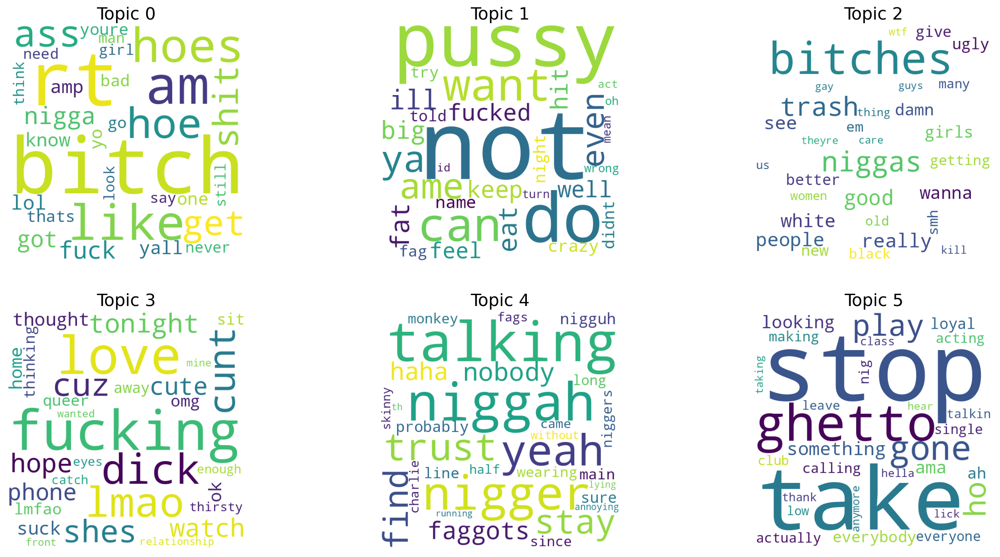

In [28]:
df5, img5, pylda5 = topicmod(corpus=c1_corpus, n=2, mini=20, num_topics=6, y=2, x=3)

In [29]:
df5

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
Topic coherence,-3.198688,-5.054039,-6.150637,-11.996218,-14.607491,-16.102717
Word 1,bitch,bitches,not,fucking,stop,talking
Word 2,rt,niggas,pussy,love,take,niggah
Word 3,am,trash,do,lmao,ghetto,nigger
Word 4,like,good,can,dick,gone,yeah
Word 5,hoes,really,want,cunt,ho,trust
Word 6,hoe,people,ya,cuz,play,stay
Word 7,ass,see,ame,shes,something,find
Word 8,get,white,even,tonight,ama,nobody
Word 9,shit,wanna,ill,hope,looking,haha


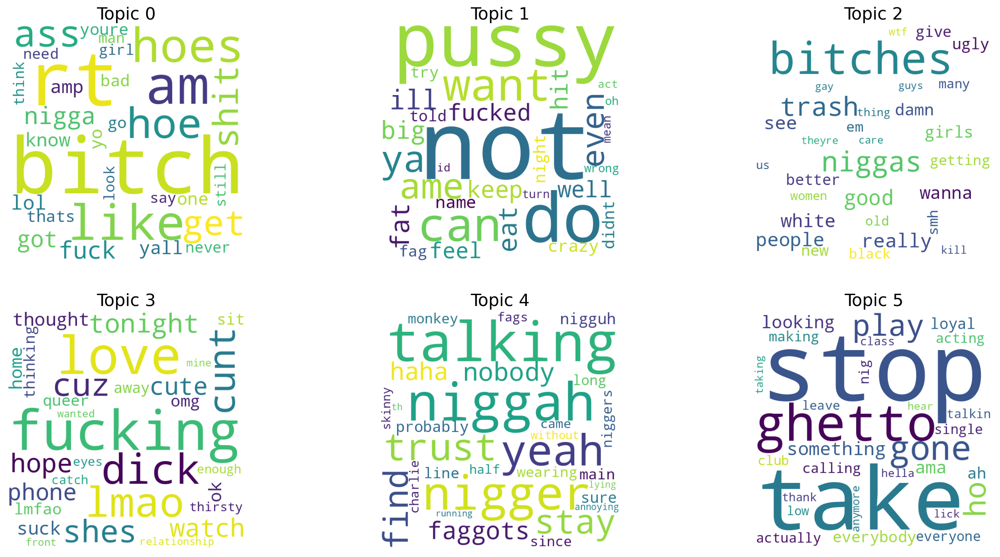

In [30]:
img5

In [31]:
pylda5

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.421632 -0.035153       1        1  52.715337
1     -0.160159 -0.344048       2        1  15.314869
2     -0.119695  0.308206       3        1  14.132646
3     -0.054136  0.026715       4        1   6.895008
4     -0.046519  0.022809       5        1   5.686889
5     -0.041123  0.021471       6        1   5.255250, topic_info=         Term         Freq        Total Category  logprob  loglift
1904  bitches  3380.000000  3380.000000  Default  30.0000  30.0000
30        not  3513.000000  3513.000000  Default  29.0000  29.0000
1356    bitch  8149.000000  8149.000000  Default  28.0000  28.0000
2151       rt  7641.000000  7641.000000  Default  27.0000  27.0000
394     pussy  2012.000000  2012.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
2224    hella    54.631110    55.443924   Topic6  -5.0482   2.9312
678   anymore    53.210952    54.025777   Topic6  -5.0746   2.9307
2315     lick    49.751390    50.565157   Topic6  -5.1418   2.9297
2699   taking    49.442841    50.255454   Topic6  -5.1480   2.9296
1347     hear    48.982817    49.794847   Topic6  -5.1574   2.9295

[212 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1610      2  0.992020       act
1398      6  0.984914    acting
1225      6  0.988267  actually
2453      6  0.990326        ah
39        1  0.999664        am
...     ...       ...       ...
1080      2  0.999206        ya
807       1  0.998867      yall
1580      5  0.995369      yeah
1664      1  0.998850        yo
131       1  0.999047     youre

[184 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6])

    3. Non toxic cleaned tweets

In [32]:
c0_corpus = clean_0["tweet_clean"].to_list()
tok = tmm.PreprocessingCorpus(corpus=c0_corpus)
tok.tokenization()
c0_corpus = tok.corpus

Tokenization done.


The generated dictionary contains 5591 unique tokens.
Number of unique tokens: 5591
Number of documents: 29113
The model has been trained successfully.
Average topic coherence: -8.3648.

-4.468972181232992 ['like', 'amp', 'ame', 'one', 'bird', 'get', 'today', 'good', 'yankees', 'see', 'birds', 'go', 'got', 'back', 'lol', 'know', 'really', 'game', 'us', 'work']

-4.819387611580124 ['love', 'life', 'people', 'make', 'smile', 'fun', 'never', 'best', 'friends', 'home', 'beautiful', 'would', 'made', 'cute', 'thats', 'always', 'orlando', 'makes', 'someone', 'happiness']

-6.265252013778625 ['rt', 'trash', 'new', 'first', 'night', 'last', 'tonight', 'thanks', 'week', 'year', 'next', 'come', 'tomorrow', 'brownies', 'getting', 'looking', 'ready', 'another', 'show', 'making']

-9.0747231014363 ['day', 'happy', 'yellow', 'fathers', 'great', 'need', 'weekend', 'morning', 'summer', 'friday', 'music', 'fathersday', 'thank', 'blog', 'gold', 'god', 'silver', 'dad', 'everyone', 'girls']

-10.9821682564

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.


/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transp

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbo

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use tex

/home/vincent/miniconda3/envs/hn/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


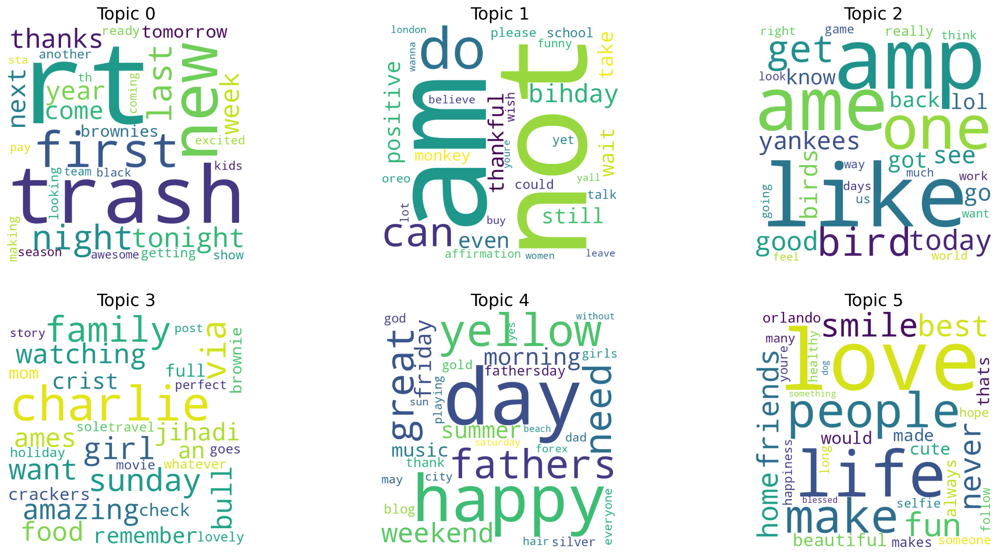

In [33]:
df6, img6, pylda6 = topicmod(corpus=c0_corpus, n=2, mini=20, num_topics=6, y=2, x=3)

In [34]:
df6

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
Topic coherence,-4.468972,-4.819388,-6.265252,-9.074723,-10.982168,-14.57857
Word 1,like,love,rt,day,am,charlie
Word 2,amp,life,trash,happy,not,family
Word 3,ame,people,new,yellow,do,via
Word 4,one,make,first,fathers,can,sunday
Word 5,bird,smile,night,great,bihday,girl
Word 6,get,fun,last,need,positive,want
Word 7,today,never,tonight,weekend,even,amazing
Word 8,good,best,thanks,morning,still,bull
Word 9,yankees,friends,week,summer,thankful,watching


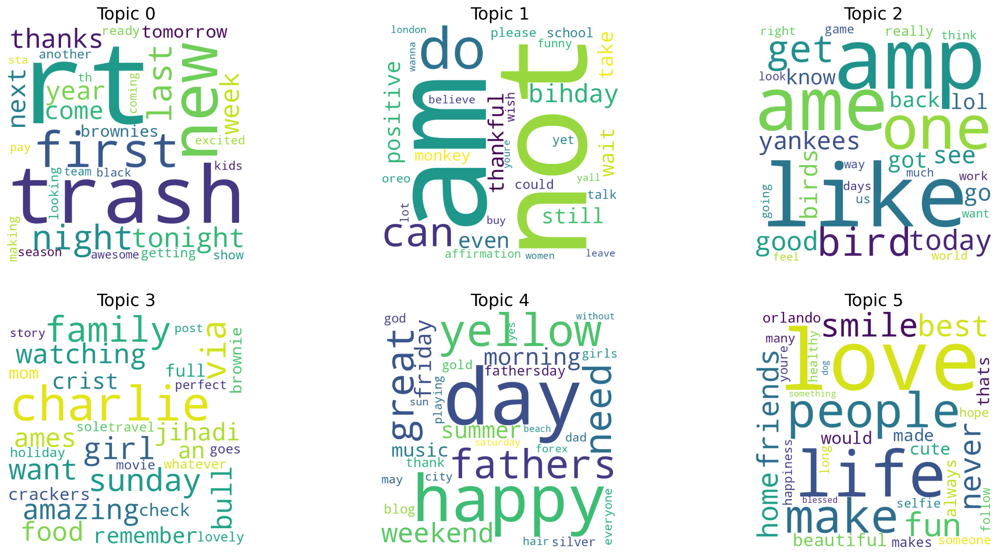

In [37]:
img6

In [38]:
pylda6

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.387958 -0.130593       1        1  26.543183
5      0.218383 -0.198454       2        1  18.652532
0     -0.015991  0.388227       3        1  17.011624
4      0.109625  0.038734       4        1  13.820996
1      0.094474 -0.063521       5        1  12.085982
3     -0.018532 -0.034392       6        1  11.885683, topic_info=         Term         Freq        Total Category  logprob  loglift
5517       rt  3004.000000  3004.000000  Default  30.0000  30.0000
43         am  1769.000000  1769.000000  Default  29.0000  29.0000
101       day  1775.000000  1775.000000  Default  28.0000  28.0000
9         not  1546.000000  1546.000000  Default  27.0000  27.0000
42       love  1794.000000  1794.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
1174  perfect   101.992651   102.796749   Topic6  -5.3731   2.1220
1189    story    97.994266    98.799199   Topic6  -5.4131   2.1217
597      post    96.788968    97.593485   Topic6  -5.4255   2.1216
1381     walk    92.309085    93.115716   Topic6  -5.4729   2.1211
549      want   235.687984   557.101352   Topic6  -4.5355   1.2696

[220 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
194       5  0.993735  affirmation
361       2  0.996546       always
43        5  0.999586           am
195       6  0.995019      amazing
99        1  0.996580          ame
...     ...       ...          ...
1606      4  0.998485       yellow
345       4  0.997867          yes
1409      5  0.998013          yet
808       2  0.718194        youre
808       5  0.280496        youre

[196 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 6, 1, 5, 2, 4])